In [1]:
# Import Packages
import os
import netCDF4 as nc
from osgeo import gdal
import numpy as np
import xarray as xr
import hvplot.xarray
import holoviews as hv
import sys
sys.path.append('../modules/')
from rasterio.warp import Resampling, reproject
import emit_tools
import rioxarray as rxr
import matplotlib.pyplot as plt

In [2]:
#set filename for emit data
emit_filename = '/Users/spai/Downloads/EMIT L2A Cape Town/EMIT_L2A_RFL_001_20230119T114247_2301907_005.nc'

In [3]:
emitmask_filename = '/Users/spai/Downloads/EMIT L2A Cape Town/EMIT_L2A_MASK_001_20230119T114247_2301907_005.nc'
mask_parameters_ds = xr.open_dataset(emitmask_filename,engine = 'h5netcdf', group='sensor_band_parameters')
mask_key = mask_parameters_ds['mask_bands'].to_dataframe()
mask_key

,mask_bands
bands,
0,Cloud flag
1,Cirrus flag
2,Water flag
3,Spacecraft Flag
4,Dilated Cloud Flag
5,AOD550
6,H2O (g cm-2)
7,Aggregate Flag


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


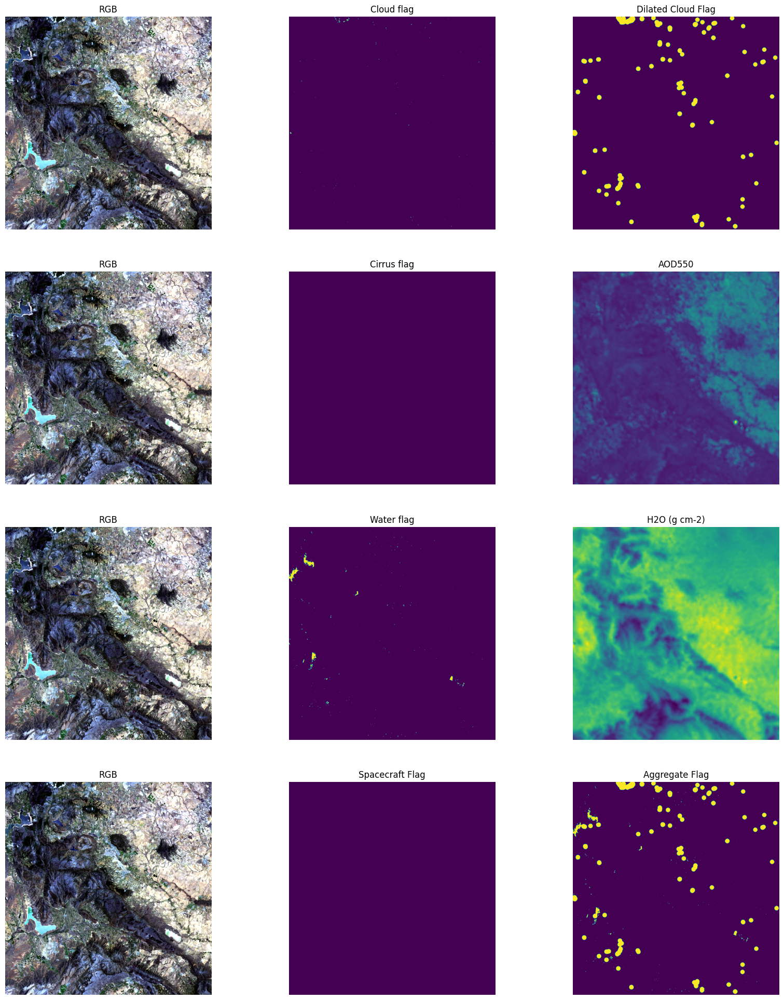

In [4]:
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
fig = plt.figure(figsize=(20,50))
gs = gridspec.GridSpec(ncols=3, nrows=len(mask_key), figure=fig)

ds = emit_tools.emit_xarray(emit_filename, ortho = False)
mask_ds = emit_tools.emit_xarray(emitmask_filename, ortho=False)

rgb_inds = np.array([np.nanargmin(abs(ds['wavelengths'].values - x)) for x in [650, 560, 470]])
rgb = ds['reflectance'].values[:,:,rgb_inds] # subset RGB
rgb[rgb < 0] = np.nan
rgb -= np.nanpercentile(rgb,2,axis=(0,1))[np.newaxis,np.newaxis,:] # scale from 2-95 %
rgb /= np.nanpercentile(rgb,95,axis=(0,1))[np.newaxis,np.newaxis,:]

for _n in range(int(len(mask_key)/2)):
    ax = fig.add_subplot(gs[_n, 0])
    plt.imshow(rgb);
    plt.axis('off')
    plt.title('RGB')
    
    ax = fig.add_subplot(gs[_n, 1])
    md = mask_ds['mask'].values[...,_n]
    md[np.isnan(rgb[...,0])] = np.nan
    plt.imshow(md);
    plt.axis('off')
    plt.title(mask_key['mask_bands'][_n])
    
    ax = fig.add_subplot(gs[_n, 2])
    md = mask_ds['mask'].values[...,_n+int(len(mask_key)/2)]
    md[np.isnan(rgb[...,0])] = np.nan
    plt.imshow(md);
    plt.axis('off')
    plt.title(mask_key['mask_bands'][_n+int(len(mask_key)/2)])

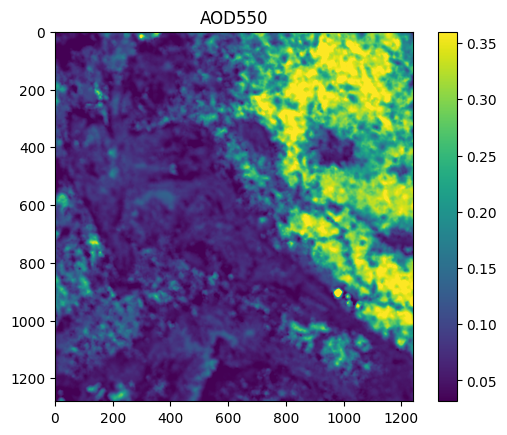

In [5]:
fig = plt.figure()
md = mask_ds['mask'].values[:,:,list(mask_key['mask_bands']).index('AOD550')]
md[np.isnan(rgb[...,0])] = np.nan
plt.imshow(md, vmin=np.nanpercentile(md,2),vmax=np.nanpercentile(md,98));
plt.title('AOD550')
plt.colorbar()

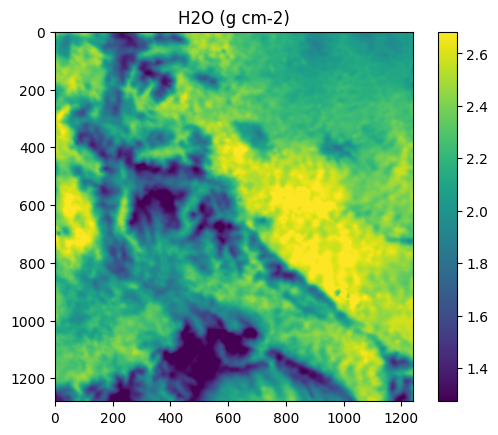

In [6]:
fig = plt.figure()
md = mask_ds['mask'].values[:,:,list(mask_key['mask_bands']).index('H2O (g cm-2)')]
md[np.isnan(rgb[...,0])] = np.nan
plt.imshow(md, vmin=np.nanpercentile(md,2),vmax=np.nanpercentile(md,98));
plt.title('H2O (g cm-2)')
plt.colorbar()

In [7]:
mask_key

,mask_bands
bands,
0,Cloud flag
1,Cirrus flag
2,Water flag
3,Spacecraft Flag
4,Dilated Cloud Flag
5,AOD550
6,H2O (g cm-2)
7,Aggregate Flag


Flags used: ['Cloud flag' 'Cirrus flag' 'Spacecraft Flag' 'Dilated Cloud Flag']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0, 0.5, 'Reflectance')

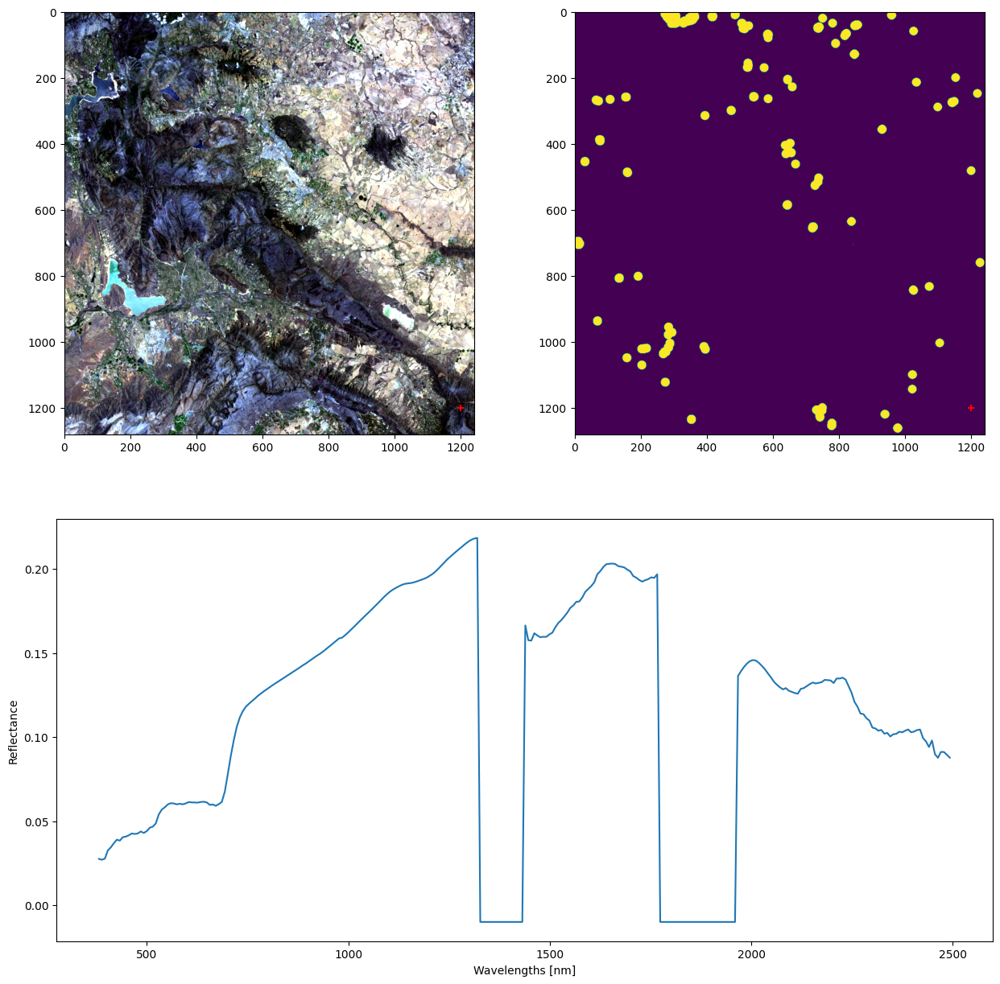

In [8]:
flags = [0,1,3,4]
mask = emit_tools.quality_mask(emitmask_filename,flags)
fig = plt.figure(figsize=(15,15))
gs = gridspec.GridSpec(ncols=2, nrows=2, figure=fig)

ax = fig.add_subplot(gs[0, 0])
plt.imshow(rgb)
plt.scatter(1200,1200,c='red',marker='+')

ax = fig.add_subplot(gs[0, 1])
plt.imshow(mask)
plt.scatter(1200,1200,c='red',marker='+')

ax = fig.add_subplot(gs[1, :])
plt.plot(ds['wavelengths'],ds['reflectance'].values[1200,1200,:])
plt.xlabel('Wavelengths [nm]')
plt.ylabel('Reflectance')

In [9]:
ds = emit_tools.emit_xarray(emit_filename, ortho=True, qmask=mask)
ds

<xarray.Dataset>
Dimensions:           (latitude: 1901, longitude: 2346, bands: 285)
Coordinates:
  * latitude          (latitude) float64 -33.12 -33.13 -33.13 ... -34.15 -34.15
  * longitude         (longitude) float64 18.47 18.47 18.47 ... 19.74 19.74
    fwhm              (bands) float32 8.415 8.415 8.415 ... 8.806 8.807 8.809
    good_wavelengths  (bands) float32 1.0 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
    wavelengths       (bands) float32 381.0 388.4 395.8 ... 2.486e+03 2.493e+03
    spatial_ref       int64 0
Dimensions without coordinates: bands
Data variables:
    reflectance       (latitude, longitude, bands) float32 nan nan ... nan nan
Attributes: (12/40)
    ncei_template_version:             NCEI_NetCDF_Swath_Template_v2.0
    summary:                           The Earth Surface Mineral Dust Source ...
    keywords:                          Imaging Spectroscopy, minerals, EMIT, ...
    Conventions:                       CF-1.63
    sensor:                            EMIT (Earth Surface Mineral Dust Sourc...
    instrument:                        EMIT
    ...                                ...
    spatial_ref:                       GEOGCS["WGS 84",DATUM["WGS_1984",SPHER...
    geotransform:                      [ 1.84708746e+01  5.42232520e-04 -0.00...
    day_night_flag:                    Day
    title:                             EMIT L2A Estimated Surface Reflectance...
    granule_id:                        EMIT_L2A_RFL_001_20230119T114247_23019...
    Orthorectified:                    True

In [10]:
red = np.nanargmin(abs(ds['wavelengths'].data-650)) # Find closes band to 650 - Red
ds.isel(bands=red).hvplot.image(cmap='viridis', aspect = 'equal', frame_width=500, rasterize=True)

:DynamicMap   []
   :Image   [longitude,latitude]   (reflectance)

In [11]:
ds.to_netcdf('/Users/spai/Downloads/EMIT L2A Cape Town/example_quality_nc_out.nc')
# Example for Opening 
# ds = xr.open_dataset('../data/example_quality_nc_out.nc')

In [12]:
#get landsat data
landsat = rxr.open_rasterio('/Users/spai/Downloads/Landsat_CapeTown_GFCC30TC_p175r083_TC_2015/p175r083_TC_2015.tif',masked=True).squeeze()

In [13]:
#set water to NA, anything >100 will be set to NA
landsat_nowater = landsat.where(landsat <= 100)

In [14]:
#reproject treecover (bilinear interpolation) and match emit data
landsat_emitCRS = landsat_nowater.rio.reproject_match(ds, resampling=Resampling.bilinear)

0


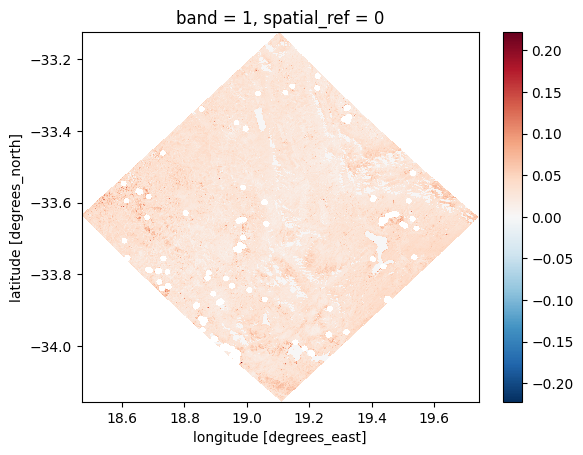

10


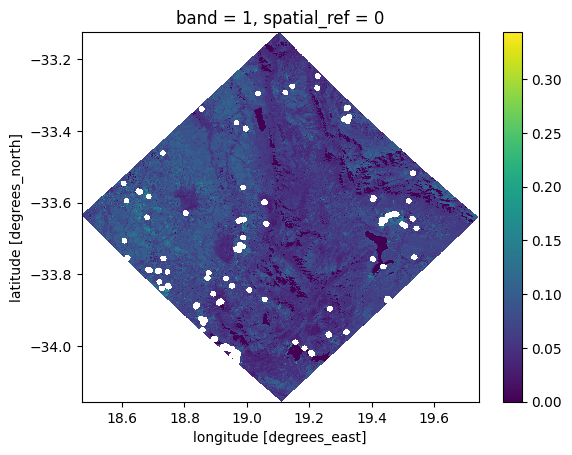

20


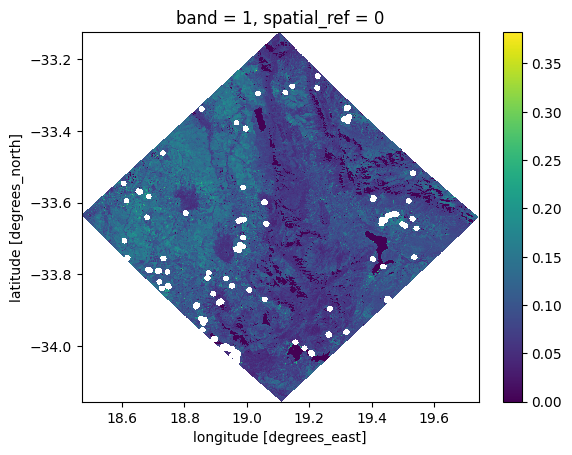

30


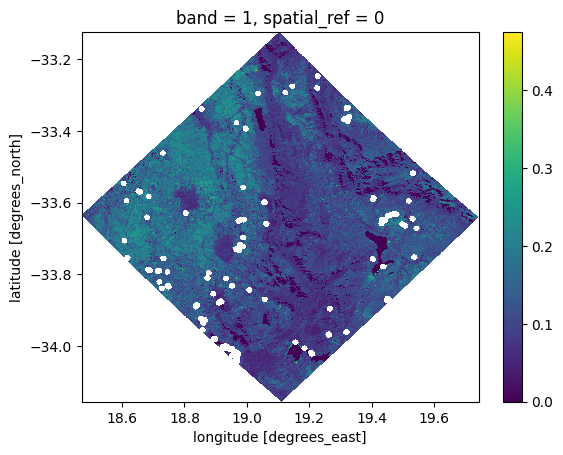

40


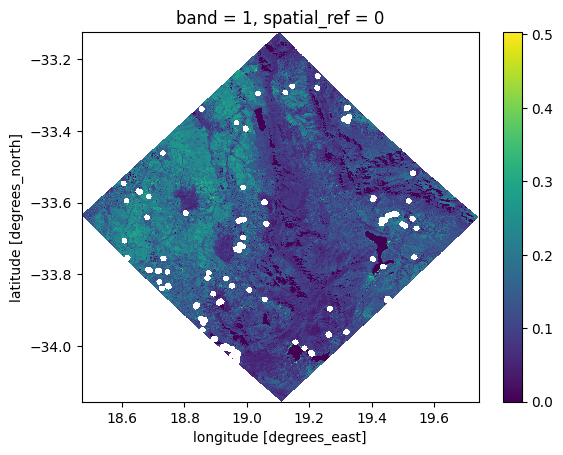

50


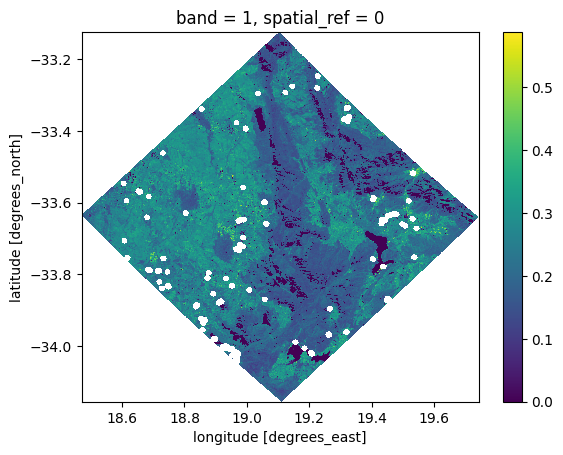

60


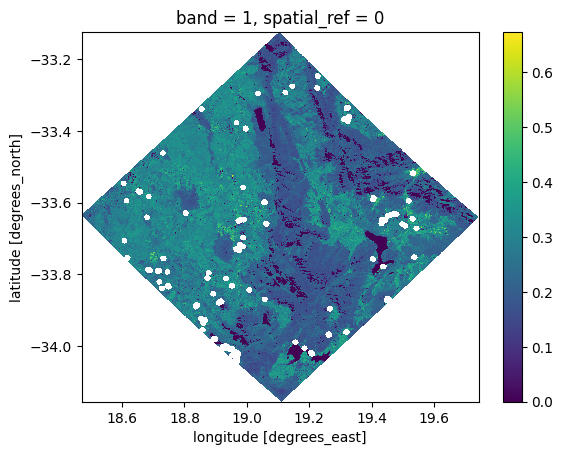

70


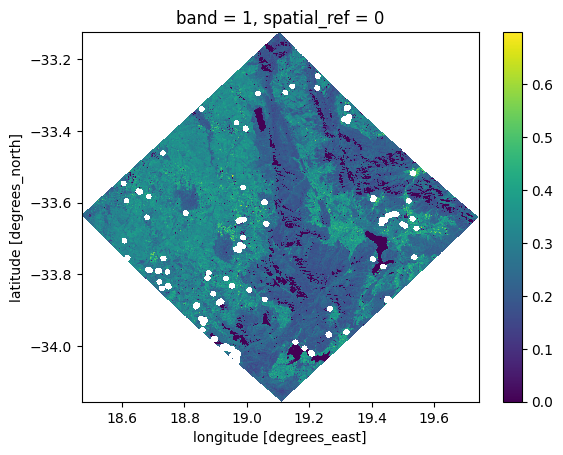

80


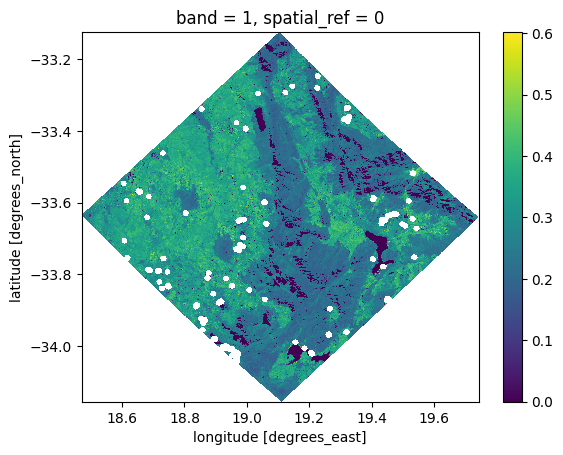

90


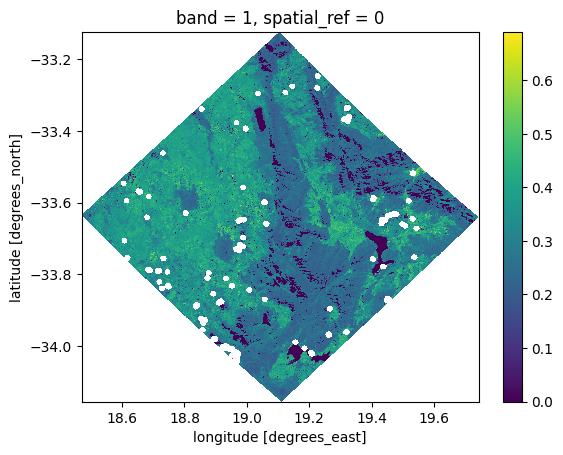

100


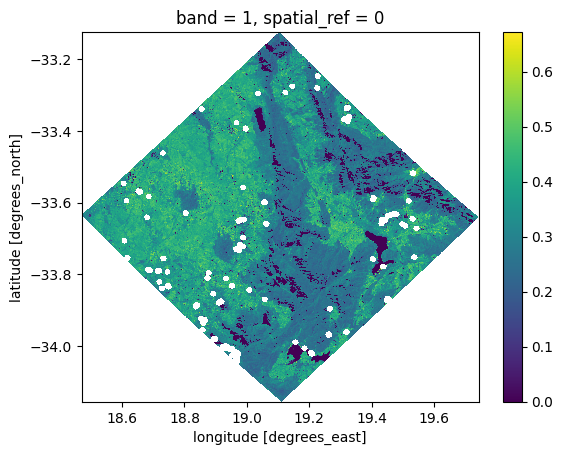

110


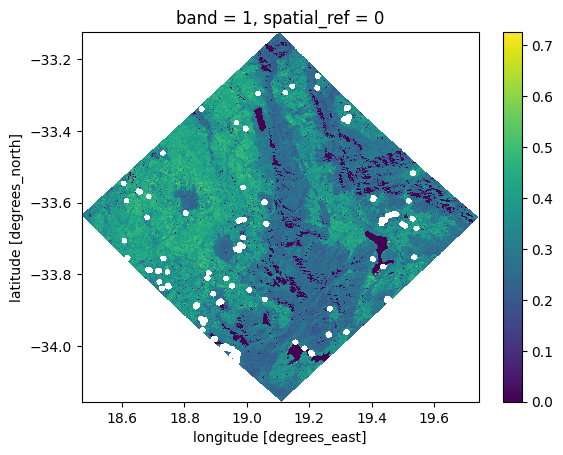

120


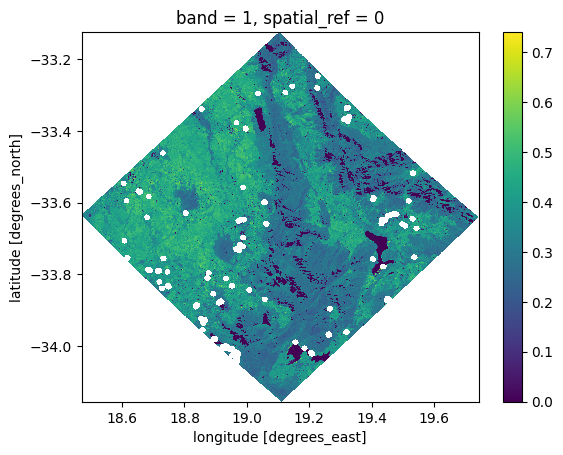

130


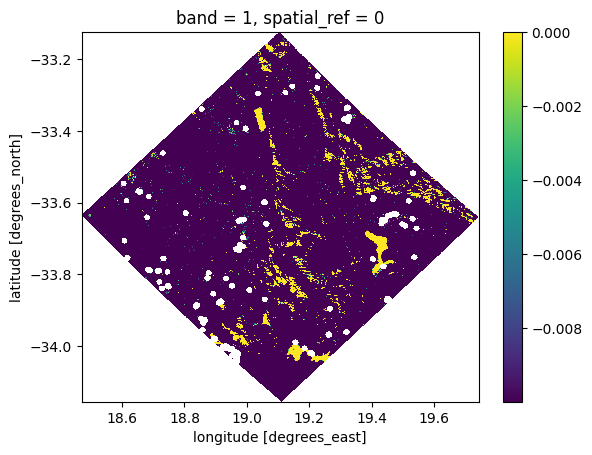

140


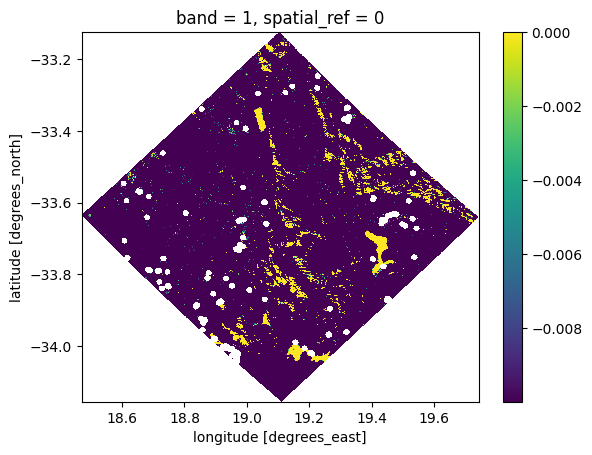

150


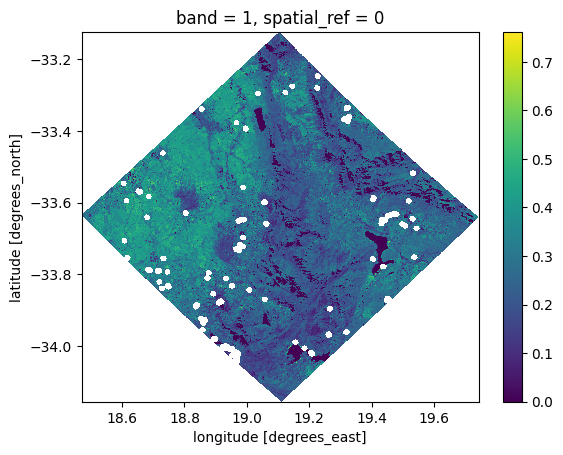

160


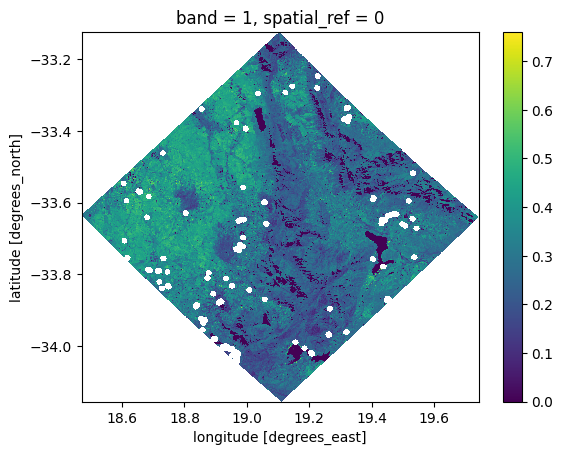

170


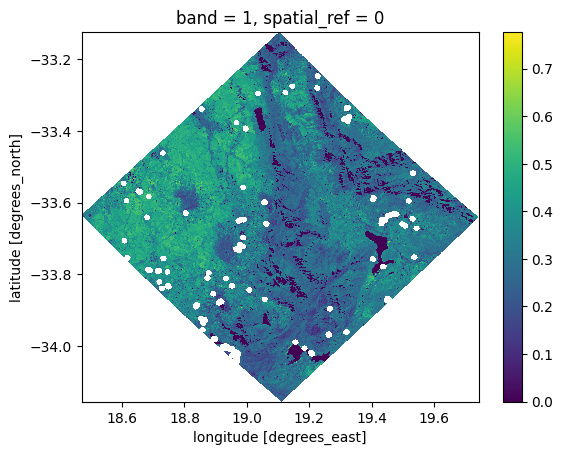

180


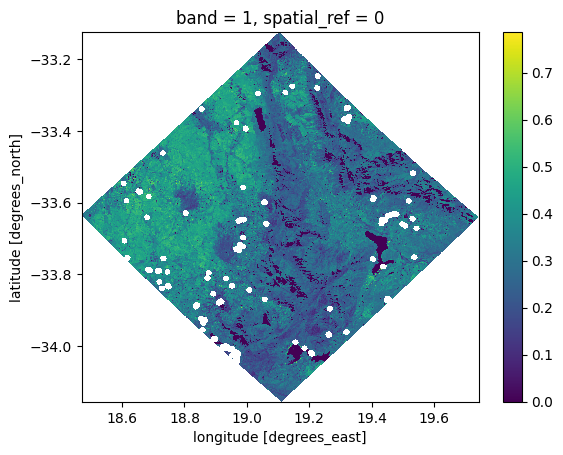

190


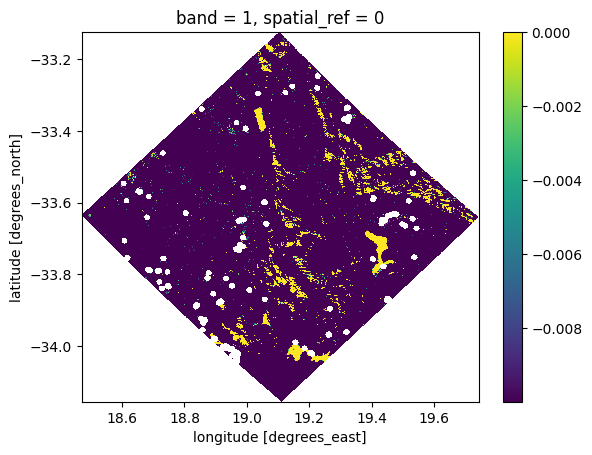

200


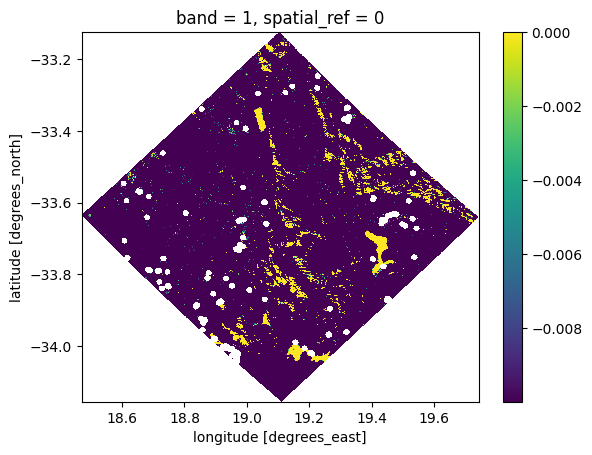

210


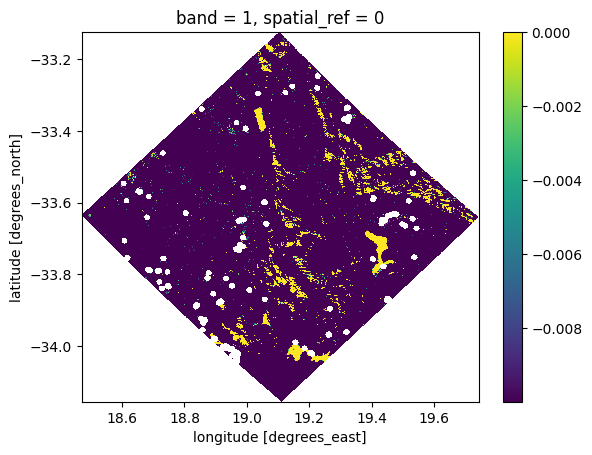

220


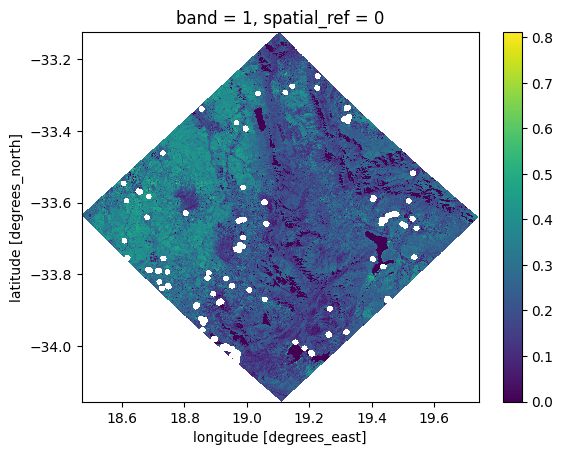

230


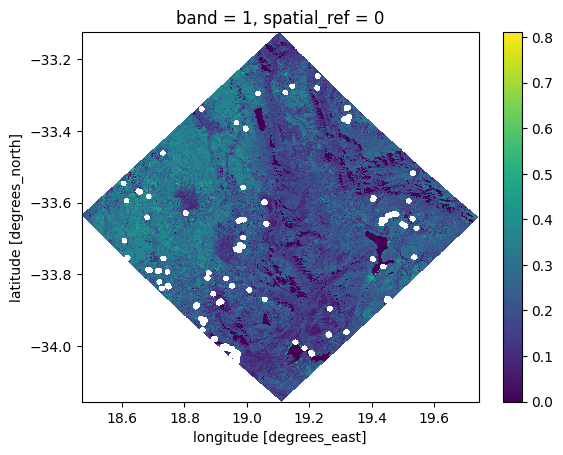

240


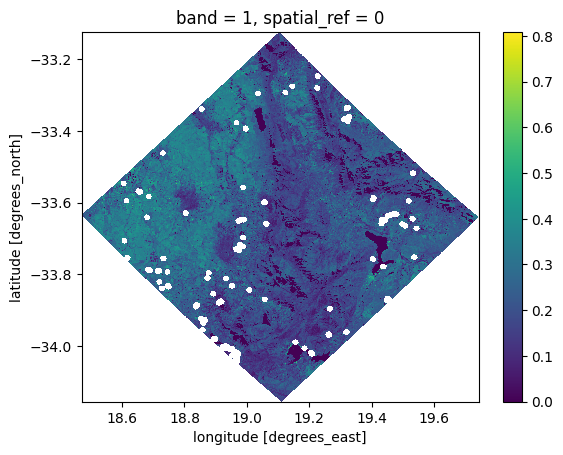

250


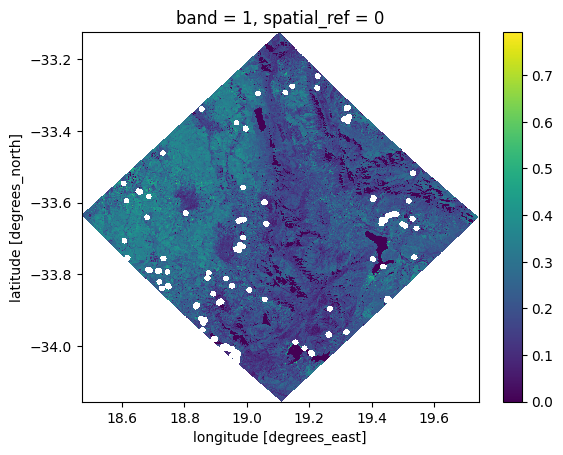

260


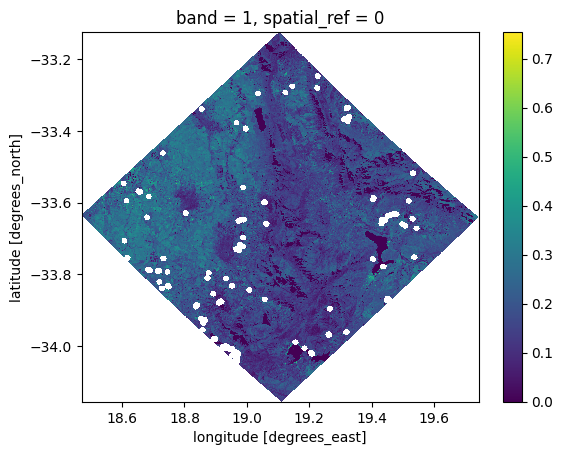

270


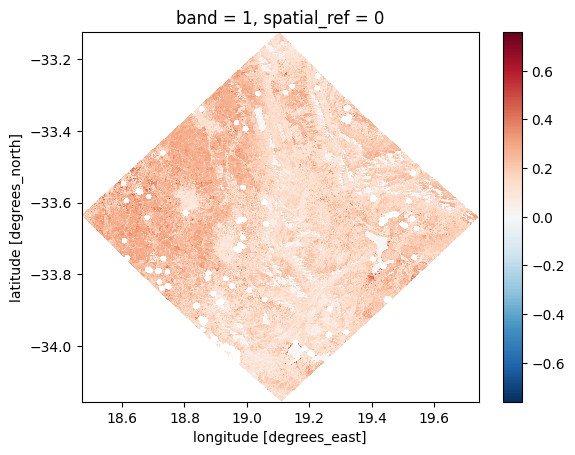

280


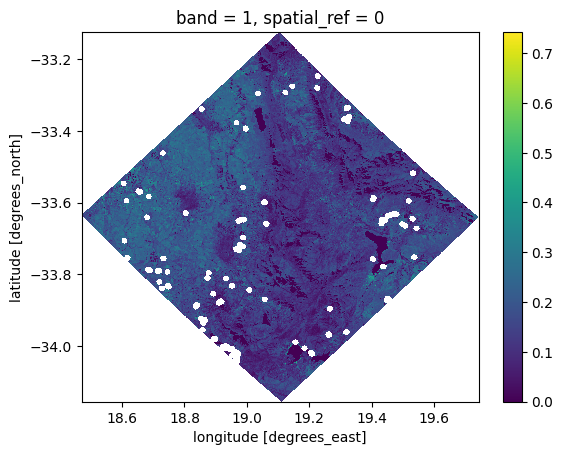

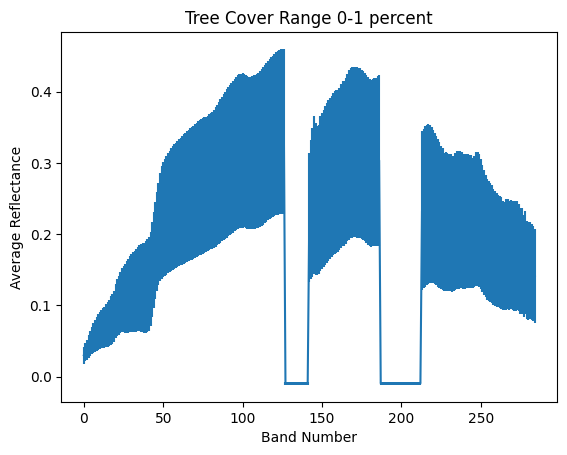

In [16]:
#for zero
mask_TC = landsat_emitCRS.where(landsat_emitCRS >= 0, 1, 0).where(landsat_emitCRS < 1, 1, 0)
band_numbers = ds['bands'].data
emit_masked_TC = [None] * len(band_numbers)
for i in range(len(band_numbers)):
    #print status every 10 bands
    if (i % 10) == 0:
        print(i)
    emit_masked_TC[i] = ds['reflectance'].sel(bands=i).data * mask_TC
    if (i % 10) == 0:
        plt.figure()
        emit_masked_TC[i].plot()
        plt.show()
emit_mask_v0 = ds['reflectance'].sel(bands=50).data * mask_TC.rename({'x': 'longitude', 'y':'latitude'})
averages = [None] * len(band_numbers)
stds = [None] * len(band_numbers)
for i in range(len(band_numbers)):
    averages[i] = emit_masked_TC[i].mean()
    stds[i] = emit_masked_TC[i].std()
averages_x = xr.DataArray(data = averages)
stds_x = xr.DataArray(data = stds)
plt.figure()
plt.errorbar(band_numbers, averages_x, stds_x, linestyle='solid')
plt.xlabel("Band Number")
plt.ylabel("Average Reflectance")
plt.title("Tree Cover Range 0-1 percent")
plt.show()

1
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280


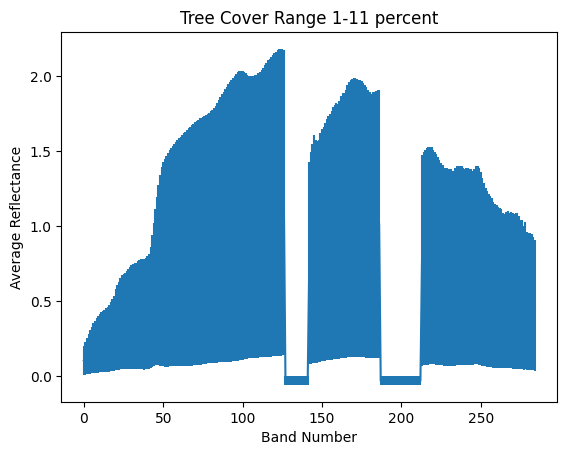

11
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280


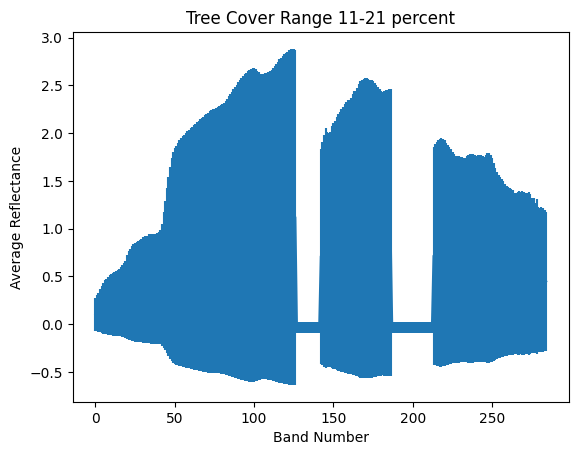

21
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280


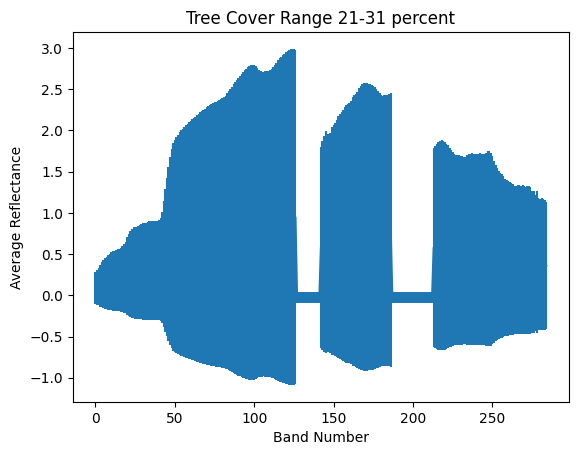

31
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280


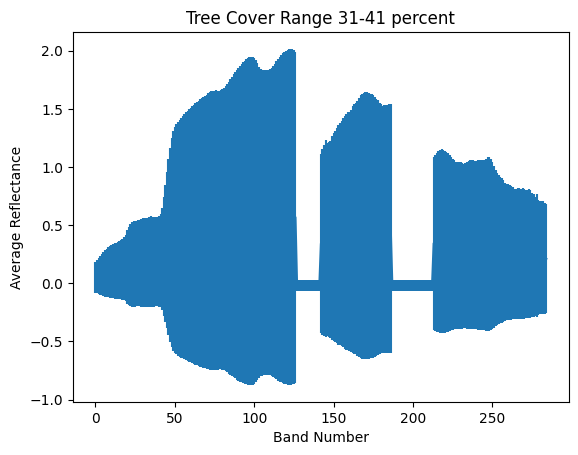

41
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280


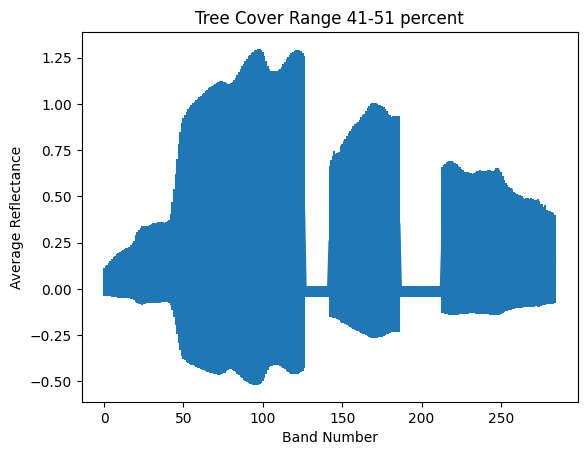

51
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280


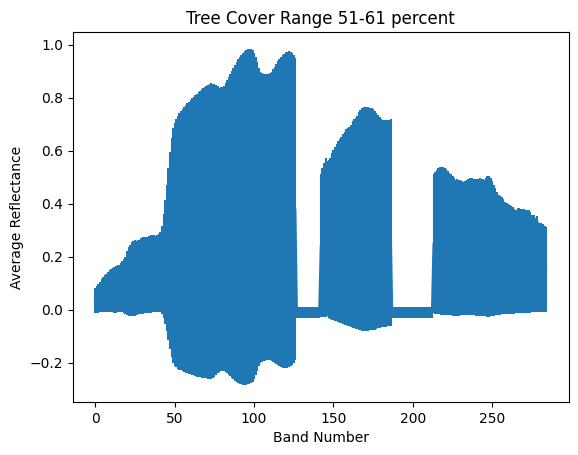

61
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280


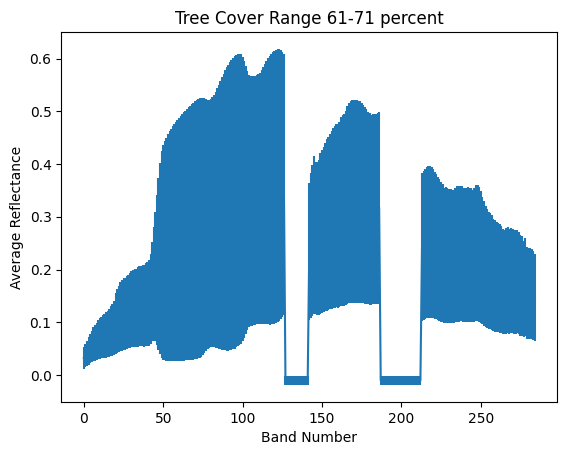

71
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280


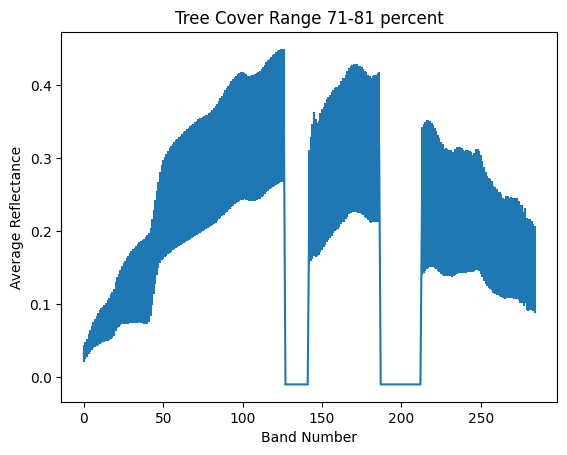

81
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280


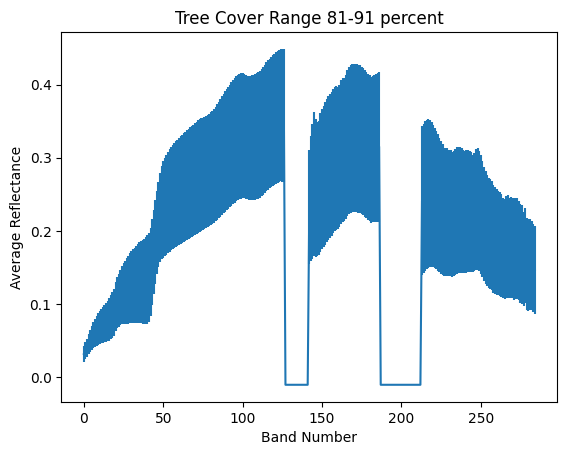

91
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280


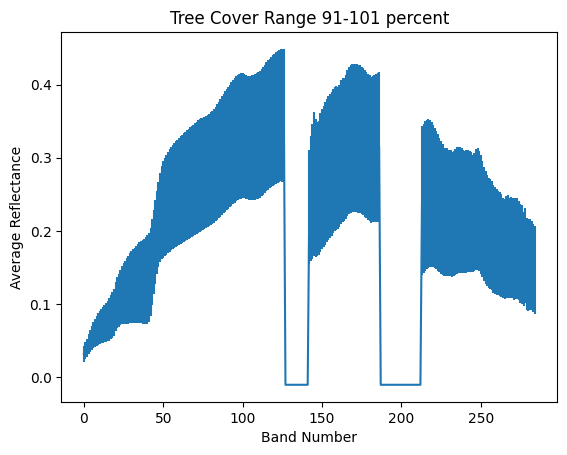

In [17]:
for x in range (1,101,10):
    print(x)
    #form mask for the specified level of tree cover
    mask_TC = landsat_emitCRS.where(landsat_emitCRS >= x, 1, 0).where(landsat_emitCRS < x+10, 1, 0)
    band_numbers = ds['bands'].data
    emit_masked_TC = [None] * len(band_numbers)
    averages = [None] * len(band_numbers)
    stds = [None] * len(band_numbers)
    for i in range(len(band_numbers)):
        #print status every 10 bands
        if (i % 10) == 0:
            print(i)
        emit_masked_TC[i] = ds['reflectance'].sel(bands=i).data * mask_TC
        averages[i] = emit_masked_TC[i].mean()
        stds[i] = emit_masked_TC[i].std()
    averages_x = xr.DataArray(data = averages)
    stds_x = xr.DataArray(data = stds)
    plt.figure()
    plt.errorbar(band_numbers, averages_x, stds_x, linestyle='solid')
    plt.xlabel("Band Number")
    plt.ylabel("Average Reflectance")
    plt.title("Tree Cover Range "+str(x)+"-"+str(x+10)+" percent")
    plt.show()